# Delay-embedded committor calculations 

In [1]:
import numpy as np
import extq
import matplotlib.pyplot as plt
from matplotlib import ticker
import pyemma
import glob
import sys
import importlib
import gc
import sklearn
from sklearn import metrics
import ivac
import seaborn as sns

In [2]:
sys.path.insert(1, "../../python")
sys.path.insert(1, "../../..")
import util
import kde

In [29]:
from util import delay_embed, lift_function

In [3]:
plt.style.use("seaborn-ticks")
sns.set_palette("colorblind")

# Load data and CVs 

In [4]:
livac_trajs = np.load(
    "../../data/sb_ind100_TICA/livac_trajs_anton.npy", allow_pickle=True
)
ri_trajs = np.load("../../data/raw_feat/ri126_dist_anton.npz.npy", allow_pickle=True)
cv_trajs = np.load("../../data/raw_feat/cv_dist_spin_anton.npy", allow_pickle=True)

In [5]:
sb_labels = []
for r in ("R217", "R223", "R226", "R229", "R232"):
    for n in ("D129", "D136", "D151", "D164", "E183", "D186"):
        sb_labels.append(f"{r} - {n}")

In [6]:
with np.load("../../data/raw_feat/feat2_raw.npz", allow_pickle=True) as f:
    data_trajs = f["arr_0"]

In [7]:
print(len(data_trajs))
print(data_trajs[0].shape)

1295
(3000, 60)


In [8]:
remove = [
    1282,
    1283,
    1284,
    1285,
    1286,
    1288,
    1289,
    1290,
    1187,
    1188,
    1189,
    1190,
    1191,
    1197,
    1198,
    1199,
    1203,
    1205,
    1206,
    1207,
    1211,
    1212,
    1213,
    1214,
    1215,
    1225,
    1226,
    1227,
    1228,
    1231,
    1232,
    1233,
    1236,
    1237,
    1238,
    1242,
    1245,
    1246,
    1252,
    1253,
    1260,
    1261,
    1262,
    1263,
    1266,
    1267,
    1268,
    1269,
    1270,
    1271,
    1272,
    1273,
    1274,
    1275,
    1276,
    1277,
    1278,
    1279,
]

In [9]:
data_trajs = list(data_trajs)
for idx in sorted(remove, reverse=True):
    del data_trajs[idx]
data_trajs = data_trajs[1000:]
print(len(livac_trajs), len(ri_trajs), len(data_trajs), len(cv_trajs))

livac_arr = np.concatenate(livac_trajs)
ri_arr = np.concatenate(ri_trajs)
data_arr = np.concatenate(data_trajs)
cv_arr = np.concatenate(cv_trajs)
print(livac_arr.shape, ri_arr.shape, data_arr.shape, cv_arr.shape)

237 237 237 237
(3000000, 5) (3000000, 5) (3000000, 60) (3000000, 2)


In [11]:
np.save("../../data/raw_feat/feat2_raw_anton.npy", data_trajs)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


# Delay embed 

In [35]:
# make delay embedded data (stolen from Erik Thiede's repo)
def delay_embed(tlist, n_embed, lag=1):
    # tlist is list of trajectories
    embed_traj_list = []
    for i, traj_i in enumerate(tlist):
        N_i = len(traj_i)
        if N_i - (lag * n_embed) <= 0:  # Must be longer than max embedding
            continue
        embed_traj_i = []
        for n in range(n_embed + 1):
            start_ndx = lag * (n_embed - n)
            stop_ndx = N_i - (lag * n)
            embed_traj_i.append(traj_i[start_ndx:stop_ndx])
        embed_traj_i = np.concatenate(embed_traj_i, axis=1)
        embed_traj_list.append(embed_traj_i)

    return embed_traj_list

In [44]:
def lift_function(tlist, n_embed, lag=1):
    lifted_fxn = []
    for i, fxn_i in enumerate(tlist):
        N_i = len(fxn_i)
        if N_i - (lag * n_embed) <= 0:  # Must be longer than max embedding
            continue
        sub_fxn = fxn_i[int(n_embed * lag / 2) : int(N_i - (n_embed * lag / 2))]
        lifted_fxn.append(sub_fxn)
    return lifted_fxn

In [64]:
sb_labels

['R217 - D129',
 'R217 - D136',
 'R217 - D151',
 'R217 - D164',
 'R217 - E183',
 'R217 - D186',
 'R223 - D129',
 'R223 - D136',
 'R223 - D151',
 'R223 - D164',
 'R223 - E183',
 'R223 - D186',
 'R226 - D129',
 'R226 - D136',
 'R226 - D151',
 'R226 - D164',
 'R226 - E183',
 'R226 - D186',
 'R229 - D129',
 'R229 - D136',
 'R229 - D151',
 'R229 - D164',
 'R229 - E183',
 'R229 - D186',
 'R232 - D129',
 'R232 - D136',
 'R232 - D151',
 'R232 - D164',
 'R232 - E183',
 'R232 - D186']

In [11]:
n_embed = 10
lag = 10
# use smaller input feature set
# R223-D129, R226-D129, R226-D186, R229-D129, R229-D186, R232-D186
sb_ids = [36, 42, 47, 48, 53, 59]
data_sb = [traj[:, sb_ids] for traj in data_trajs]
embed_trajs = util.delay_embed(data_sb, n_embed, lag)
embed_arr = np.concatenate(embed_trajs)

In [12]:
print(embed_arr.shape)

(2976300, 66)


In [13]:
print(len(embed_trajs))

237


In [14]:
print(embed_trajs[0].shape)

(9900, 66)


## States

In [15]:
orig_traj_lens = [len(traj) for traj in livac_trajs]
orig_traj_inds = []
subtot = 0
for length in orig_traj_lens[:-1]:
    subtot += length
    orig_traj_inds.append(subtot)

In [16]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb5 = data_arr[:, 47]  # R2-D186
sb6 = data_arr[:, 53]  # R3-D186
sb7 = data_arr[:, 59]  # R4-D186


# ellipse centered at (4.535, 43.7) with radii 0.632 and 2.9 for up+ state
# take points where TIC 1 < -1.25
dist_ax_upp = (dist - 4.535) / 0.632
rot_ax_upp = (rot - 43.7) / 4.0
upplus_ids = (((dist_ax_upp ** 2 + rot_ax_upp ** 2) < 1) & (tic1 < -1.25)).nonzero()[0]

# ellipse centered at (0, 0) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D186 salt bridges < 0.5/0.6 nm, R2-D186 > 1
up_ids = (
    (((dist / 0.84) ** 2 + (rot / 7.6) ** 2) < 1)
    & (sb6 < 0.5)
    & (sb7 < 0.6)
    & (sb5 > 1.0)
    & (tic2 > -1)
).nonzero()[0]

In [17]:
print(len(upplus_ids), len(up_ids))

24530 9054


In [18]:
mask = np.ones(len(cv_arr), dtype=bool)
mask[upplus_ids] = False
mask[up_ids] = False

# len(**_ids) is number of points in each state
# split into lists of trajectories
upplus = np.zeros(len(cv_arr), dtype=np.float)
upplus[upplus_ids] = True
upplus = np.split(upplus, orig_traj_inds)
up = np.zeros(len(cv_arr), dtype=np.float)
up[up_ids] = True
up = np.split(up, orig_traj_inds)

In [19]:
len(up)

237

In [20]:
up[0].shape

(10000,)

In [22]:
from util import lift_function

In [23]:
# delay embed indicator functions for states
lifted_up = lift_function(up, n_embed, lag=lag)
lifted_upplus = lift_function(upplus, n_embed, lag=lag)
print(len(lifted_up), lifted_up[0].shape)
print(len(lifted_upplus), lifted_upplus[0].shape)

237 (9900,)
237 (9900,)


In [24]:
len(up_ids)

9054

In [25]:
# lift CV data
lifted_cvs = lift_function(cv_trajs, n_embed, lag=lag)
lifted_sbs = lift_function(data_trajs, n_embed, lag=lag)
print(len(lifted_cvs), lifted_cvs[0].shape)
print(len(lifted_sbs), lifted_sbs[0].shape)

237 (9900, 2)
237 (9900, 60)


In [26]:
lifted_cvs = np.concatenate(lifted_cvs)
lifted_sbs = np.concatenate(lifted_sbs)
print(lifted_cvs.shape, lifted_sbs.shape)

(2976300, 2) (2976300, 60)


In [51]:
# assert (len(upplus_ids) + len(up_ids) + len(mask)) == len(cv_arr)
print(f"Number of up+ structures:  {len(lif)}")
print(f"Number of up structures:   {len(up_ids)}")
# print(f'Number of other structures: {len(other)}')

Number of up+ structures:  24530
Number of up structures:   9054


In [27]:
lifted_traj_lens = [len(traj) for traj in lifted_cvs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

# new up and upplus ids
up_arr = np.concatenate(lifted_up)
up_ids_lifted = up_arr.nonzero()[0]
upplus_arr = np.concatenate(lifted_upplus)
upplus_ids_lifted = upplus_arr.nonzero()[0]

# states in data
up_data = embed_arr[up_ids_lifted]
upplus_data = embed_arr[upplus_ids_lifted]
print(len(up_data), len(upplus_data))

8614 24364


## Pairwise distances

In [98]:
print(sklearn.get_config()["working_memory"])

1024


In [99]:
# compute minimum distance (minimum of column) from domain to dimeric/monomeric state
def reduce_func(D_chunk, start):
    min2 = np.min(D_chunk, axis=1)
    return min2

### Up state 

In [100]:
d_up = []
counter = 0.0
tot = len(data_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, up_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.52% completed
1.04% completed
1.56% completed
2.08% completed
2.60% completed
3.12% completed
3.64% completed
4.15% completed
4.67% completed
5.19% completed
5.71% completed
6.23% completed
6.75% completed
7.27% completed
7.79% completed
8.31% completed
8.83% completed
9.35% completed
9.87% completed
10.39% completed
10.91% completed
11.43% completed
11.95% completed
12.46% completed
12.98% completed
13.50% completed
14.02% completed
14.54% completed
15.06% completed
15.58% completed
16.10% completed
16.62% completed
17.14% completed
17.66% completed
18.18% completed
18.70% completed
19.22% completed
19.74% completed
20.26% completed
20.77% completed
21.29% completed
21.81% completed
22.33% completed
22.85% completed
23.37% completed
23.89% completed
24.41% completed
24.93% completed
25.45% completed
25.97% completed
26.49% completed
27.01% completed
27.53% completed
28.05% completed
28.57% completed
29.08% completed
29.60% completed
30.12% completed
30.64% completed
31.16% completed

In [101]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids_lifted]))
d_up_arr[up_ids_lifted] = 0
print(np.max(d_up_arr[up_ids_lifted]))

print(d_up_arr.shape)

192 (15581,)
(2976300, 1)
2.2302017e-07
0.0
(2976300, 1)


In [102]:
np.save("../../data/delay_embed/sb6_1ns_10embed/dist_up.npy", d_up_arr)

In [19]:
d_up_arr = np.load("../../data/feat3_dist_anton/100/dist_up.npy")

### Up+state

In [103]:
d_upp = []
counter = 0.0
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, upplus_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.18% completed
0.37% completed
0.55% completed
0.73% completed
0.92% completed
1.10% completed
1.29% completed
1.47% completed
1.65% completed
1.84% completed
2.02% completed
2.20% completed
2.39% completed
2.57% completed
2.75% completed
2.94% completed
3.12% completed
3.30% completed
3.49% completed
3.67% completed
3.86% completed
4.04% completed
4.22% completed
4.41% completed
4.59% completed
4.77% completed
4.96% completed
5.14% completed
5.32% completed
5.51% completed
5.69% completed
5.88% completed
6.06% completed
6.24% completed
6.43% completed
6.61% completed
6.79% completed
6.98% completed
7.16% completed
7.34% completed
7.53% completed
7.71% completed
7.89% completed
8.08% completed
8.26% completed
8.45% completed
8.63% completed
8.81% completed
9.00% completed
9.18% completed
9.36% completed
9.55% completed
9.73% completed
9.91% completed
10.10% completed
10.28% completed
10.47% completed
10.65% completed
10.83% completed
11.02% completed
11.20% completed
11.38% completed


89.41% completed
89.60% completed
89.78% completed
89.96% completed
90.15% completed
90.33% completed
90.51% completed
90.70% completed
90.88% completed
91.07% completed
91.25% completed
91.43% completed
91.62% completed
91.80% completed
91.98% completed
92.17% completed
92.35% completed
92.53% completed
92.72% completed
92.90% completed
93.09% completed
93.27% completed
93.45% completed
93.64% completed
93.82% completed
94.00% completed
94.19% completed
94.37% completed
94.55% completed
94.74% completed
94.92% completed
95.10% completed
95.29% completed
95.47% completed
95.66% completed
95.84% completed
96.02% completed
96.21% completed
96.39% completed
96.57% completed
96.76% completed
96.94% completed
97.12% completed
97.31% completed
97.49% completed
97.68% completed
97.86% completed
98.04% completed
98.23% completed
98.41% completed
98.59% completed
98.78% completed
98.96% completed
99.14% completed
99.21% completed


In [104]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_up_arr[upplus_ids_lifted]))
d_upp_arr[upplus_ids_lifted] = 0
print(np.max(d_upp_arr[upplus_ids_lifted]))

print(d_upp_arr.shape)

541 (5508,)
(2976300, 1)
5.396663
0.0
(2976300, 1)


In [107]:
np.save("../../data/delay_embed/sb6_1ns_10embed/dist_upplus.npy", d_upp_arr)

## Basis set construction 

In [108]:
# make smoothing function
smooth = (d_up_arr * d_upp_arr) ** 0.5 / (d_up_arr + d_upp_arr)

# make guess
guess_up = (d_upp_arr / (d_up_arr + d_upp_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
mask = np.ones(len(embed_arr), dtype=bool)
mask[up_ids_lifted] = False
mask[upplus_ids_lifted] = False
smooth[(mask == 0).flatten()] = 0

# ensure homogeneous boundary conditions for guess
guess_up[up_ids_lifted] = 1
guess_up[upplus_ids_lifted] = 0
guess_upp[upplus_ids_lifted] = 1
guess_upp[up_ids_lifted] = 0

In [109]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(2976300, 1) (2976300, 1) (2976300, 1)


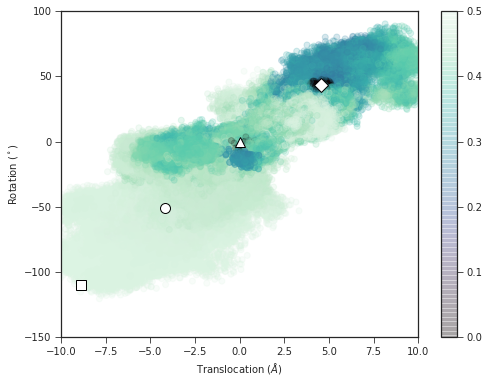

In [110]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=smooth[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

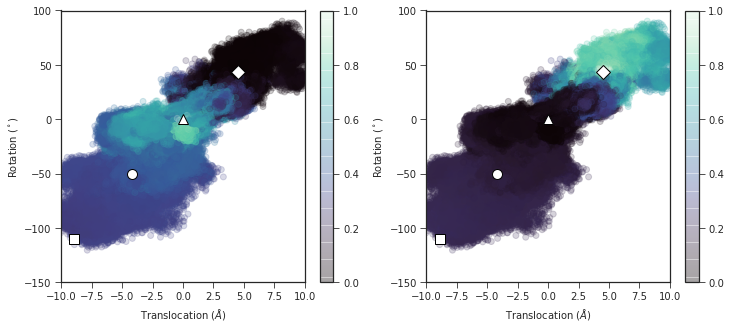

In [112]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [ ]:
def svd_whiten(X, num_retain=None):
    U, L, V = np.linalg.svd(X, full_matrices=False)
    if num_retain is None:
        return U
    else:
        return U[:, :num_retain]

In [115]:
basis_smooth = smooth * embed_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(2976300, 66)
(2976300, 66)


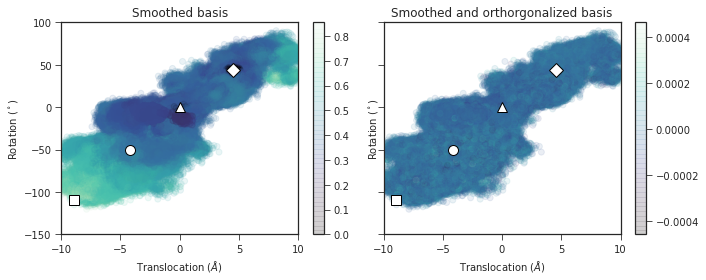

In [116]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    lifted_cvs[::10, 0],
    lifted_cvs[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    lifted_cvs[::10, 0],
    lifted_cvs[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [132]:
basisF = np.split(basis_white, lifted_traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), lifted_traj_inds)
guessU = np.split(np.squeeze(guess_upp), lifted_traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

237 (9900, 66)
237
237


In [131]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

## Change of measure 

In [133]:
# unit is 0.1 ps, up to 500 ns
lags = [1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 3000, 4000, 5000]

In [121]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(embed_trajs, lag)
    weights.append(com)

Computing change of measure for lag 1
Computing change of measure for lag 2
Computing change of measure for lag 5
Computing change of measure for lag 10
Computing change of measure for lag 20
Computing change of measure for lag 50
Computing change of measure for lag 100
Computing change of measure for lag 200
Computing change of measure for lag 500
Computing change of measure for lag 1000
Computing change of measure for lag 2000
Computing change of measure for lag 3000
Computing change of measure for lag 4000
Computing change of measure for lag 5000


In [122]:
np.save("../../data/delay_embed/sb6_1ns_10embed/coms", weights)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [124]:
print(len(weights), len(weights[0]), weights[0][0].shape)

14 237 (9900,)


## Committors

In [134]:
in_domain = np.split(mask, lifted_traj_inds)
in_domain[0].shape

(9900,)

In [135]:
in_domain = np.split(mask, lifted_traj_inds)
q_downup, q_updown, qb_downup, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000
Calculating committors for lag 3000
Calculating committors for lag 4000
Calculating committors for lag 5000


In [137]:
np.save("../../data/delay_embed/sb6_1ns_10embed/q_downup", q_downup)
np.save("../../data/delay_embed/sb6_1ns_10embed/qb_downup", qb_downup)
np.save("../../data/delay_embed/sb6_1ns_10embed/q_updown", q_updown)
np.save("../../data/delay_embed/sb6_1ns_10embed/qb_updown", qb_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


### forward committor activation 

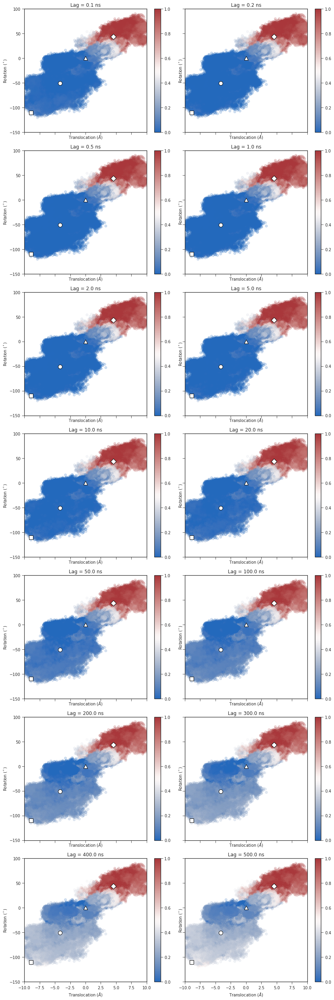

In [136]:
f, axs = plt.subplots(7, 2, figsize=(12, 35), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*lifted_cvs[::10].T, c=q_arr[::10], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)
f.tight_layout()

In [138]:
# useful salt bridges for up to up+ transition
# R229-D129, R232-D129, R229-D186, R232-D186
sb_ids_uu = [48, 54, 53, 59]

In [139]:
from itertools import combinations

In [140]:
feat2_models = np.load("../../data/models_centroids_feat2.npy")

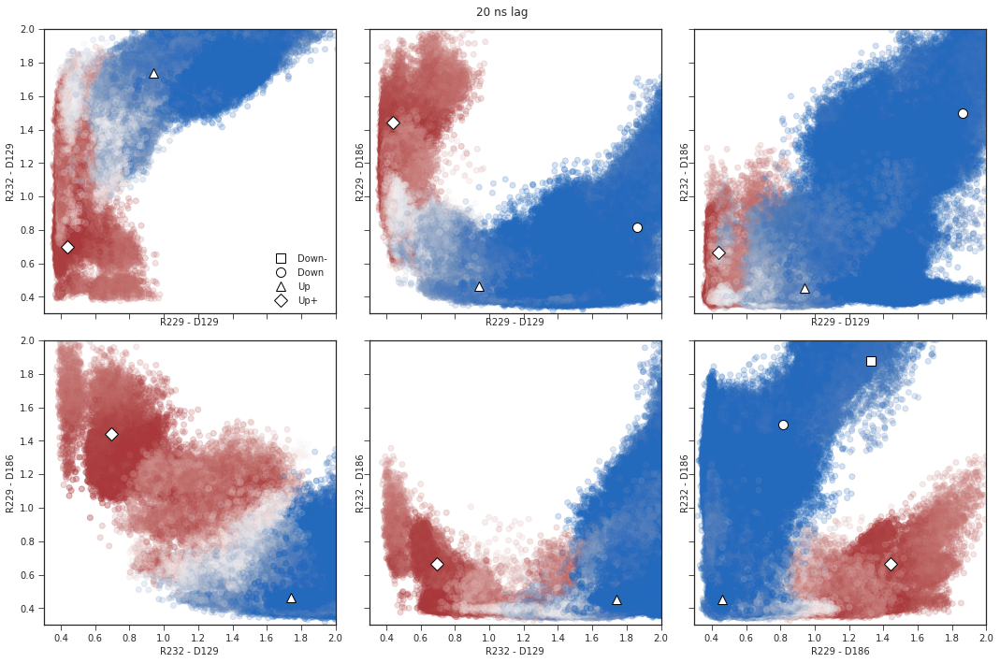

In [141]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_downup[7]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(
        lifted_sbs[::10, sb1],
        lifted_sbs[::10, sb2],
        c=q_arr[::10],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("20 ns lag")
f.tight_layout()

# Longer lag

In [144]:
n_embed = 10  # 5 ns
lag = 50
# use smaller input feature set
# R223-D129, R226-D129, R226-D186, R229-D129, R229-D186, R232-D186
sb_ids = [36, 42, 47, 48, 53, 59]
data_sb = [traj[:, sb_ids] for traj in data_trajs]
embed_trajs = delay_embed(data_sb, n_embed, lag)
embed_arr = np.concatenate(embed_trajs)

In [145]:
print(embed_arr.shape)

(2881500, 66)


In [146]:
print(len(embed_trajs))

237


In [147]:
print(embed_trajs[0].shape)

(9500, 66)


## States

In [148]:
# len(**_ids) is number of points in each state
# split into lists of trajectories
upplus = np.zeros(len(cv_arr), dtype=np.float)
upplus[upplus_ids] = True
upplus = np.split(upplus, orig_traj_inds)
up = np.zeros(len(cv_arr), dtype=np.float)
up[up_ids] = True
up = np.split(up, orig_traj_inds)

In [149]:
len(up)

237

In [150]:
up[0].shape

(10000,)

In [151]:
# delay embed indicator functions for states
lifted_up = lift_function(up, n_embed, lag=lag)
lifted_upplus = lift_function(upplus, n_embed, lag=lag)
print(len(lifted_up), lifted_up[0].shape)
print(len(lifted_upplus), lifted_upplus[0].shape)

237 (9500,)
237 (9500,)


In [152]:
len(up_ids)

9054

In [153]:
# lift CV data
lifted_cvs = lift_function(cv_trajs, n_embed, lag=lag)
lifted_sbs = lift_function(data_trajs, n_embed, lag=lag)
print(len(lifted_cvs), lifted_cvs[0].shape)
print(len(lifted_sbs), lifted_sbs[0].shape)

237 (9500, 2)
237 (9500, 60)


In [154]:
lifted_cvs = np.concatenate(lifted_cvs)
lifted_sbs = np.concatenate(lifted_sbs)
print(lifted_cvs.shape, lifted_sbs.shape)

(2881500, 2) (2881500, 60)


In [156]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

# new up and upplus ids
up_arr = np.concatenate(lifted_up)
up_ids_lifted = up_arr.nonzero()[0]
upplus_arr = np.concatenate(lifted_upplus)
upplus_ids_lifted = upplus_arr.nonzero()[0]

# states in data
up_data = embed_arr[up_ids_lifted]
upplus_data = embed_arr[upplus_ids_lifted]
print(len(up_data), len(upplus_data))

7247 23455


In [157]:
# assert (len(upplus_ids) + len(up_ids) + len(mask)) == len(cv_arr)
print(f"Number of up+ structures:  {len(upplus_ids_lifted)}")
print(f"Number of up structures:   {len(up_ids_lifted)}")
# print(f'Number of other structures: {len(other)}')

Number of up+ structures:  23455
Number of up structures:   7247


## Pairwise distances

In [158]:
print(sklearn.get_config()["working_memory"])

1024


In [159]:
# compute minimum distance (minimum of column) from domain to dimeric/monomeric state
def reduce_func(D_chunk, start):
    min2 = np.min(D_chunk, axis=1)
    return min2

### Up state 

In [160]:
d_up = []
counter = 0.0
tot = len(embed_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, up_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.64% completed
1.29% completed
1.93% completed
2.57% completed
3.21% completed
3.86% completed
4.50% completed
5.14% completed
5.78% completed
6.43% completed
7.07% completed
7.71% completed
8.36% completed
9.00% completed
9.64% completed
10.28% completed
10.93% completed
11.57% completed
12.21% completed
12.85% completed
13.50% completed
14.14% completed
14.78% completed
15.43% completed
16.07% completed
16.71% completed
17.35% completed
18.00% completed
18.64% completed
19.28% completed
19.92% completed
20.57% completed
21.21% completed
21.85% completed
22.50% completed
23.14% completed
23.78% completed
24.42% completed
25.07% completed
25.71% completed
26.35% completed
26.99% completed
27.64% completed
28.28% completed
28.92% completed
29.57% completed
30.21% completed
30.85% completed
31.49% completed
32.14% completed
32.78% completed
33.42% completed
34.06% completed
34.71% completed
35.35% completed
35.99% completed
36.64% completed
37.28% completed
37.92% completed
38.56% compl

In [161]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids_lifted]))
d_up_arr[up_ids_lifted] = 0
print(np.max(d_up_arr[up_ids_lifted]))

print(d_up_arr.shape)

156 (18520,)
(2881500, 1)
2.3841858e-07
0.0
(2881500, 1)


In [162]:
np.save("../../data/delay_embed/sb6_5ns_10embed/dist_up.npy", d_up_arr)

In [19]:
d_up_arr = np.load("../../data/feat3_dist_anton/100/dist_up.npy")

### Up+state

In [163]:
d_upp = []
counter = 0.0
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, upplus_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.20% completed
0.40% completed
0.60% completed
0.79% completed
0.99% completed
1.19% completed
1.39% completed
1.59% completed
1.79% completed
1.99% completed
2.18% completed
2.38% completed
2.58% completed
2.78% completed
2.98% completed
3.18% completed
3.38% completed
3.57% completed
3.77% completed
3.97% completed
4.17% completed
4.37% completed
4.57% completed
4.77% completed
4.96% completed
5.16% completed
5.36% completed
5.56% completed
5.76% completed
5.96% completed
6.16% completed
6.35% completed
6.55% completed
6.75% completed
6.95% completed
7.15% completed
7.35% completed
7.55% completed
7.74% completed
7.94% completed
8.14% completed
8.34% completed
8.54% completed
8.74% completed
8.94% completed
9.13% completed
9.33% completed
9.53% completed
9.73% completed
9.93% completed
10.13% completed
10.33% completed
10.52% completed
10.72% completed
10.92% completed
11.12% completed
11.32% completed
11.52% completed
11.72% completed
11.91% completed
12.11% completed
12.31% comple

96.51% completed
96.71% completed
96.91% completed
97.10% completed
97.30% completed
97.50% completed
97.70% completed
97.90% completed
98.10% completed
98.30% completed
98.49% completed
98.69% completed
98.89% completed
99.09% completed
99.29% completed
99.49% completed
99.69% completed
99.88% completed
100.00% completed


In [164]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_up_arr[upplus_ids_lifted]))
d_upp_arr[upplus_ids_lifted] = 0
print(np.max(d_upp_arr[upplus_ids_lifted]))

print(d_upp_arr.shape)

504 (5722,)
(2881500, 1)
5.2172675
0.0
(2881500, 1)


In [165]:
np.save("../../data/delay_embed/sb6_5ns_10embed/dist_upplus.npy", d_upp_arr)

### Basis set construction 

In [166]:
# make smoothing function
smooth = (d_up_arr * d_upp_arr) ** 0.5 / (d_up_arr + d_upp_arr)

# make guess
guess_up = (d_upp_arr / (d_up_arr + d_upp_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
mask = np.ones(len(embed_arr), dtype=bool)
mask[up_ids_lifted] = False
mask[upplus_ids_lifted] = False
smooth[(mask == 0).flatten()] = 0

# ensure homogeneous boundary conditions for guess
guess_up[up_ids_lifted] = 1
guess_up[upplus_ids_lifted] = 0
guess_upp[upplus_ids_lifted] = 1
guess_upp[up_ids_lifted] = 0

In [167]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(2881500, 1) (2881500, 1) (2881500, 1)


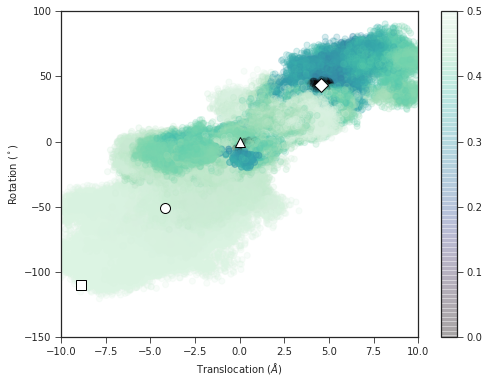

In [168]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=smooth[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

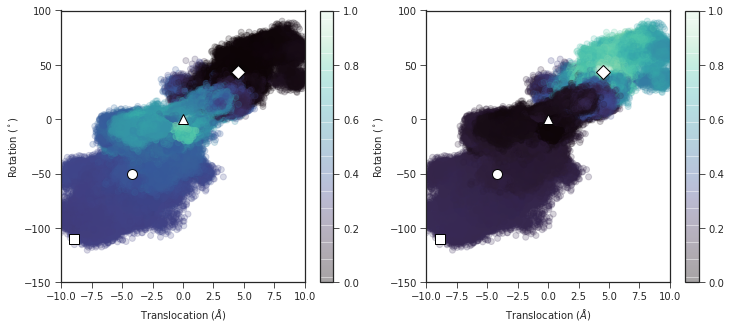

In [169]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [170]:
def svd_whiten(X, num_retain=None):
    U, L, V = np.linalg.svd(X, full_matrices=False)
    if num_retain is None:
        return U
    else:
        return U[:, :num_retain]

In [171]:
basis_smooth = smooth * embed_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(2881500, 66)
(2881500, 66)


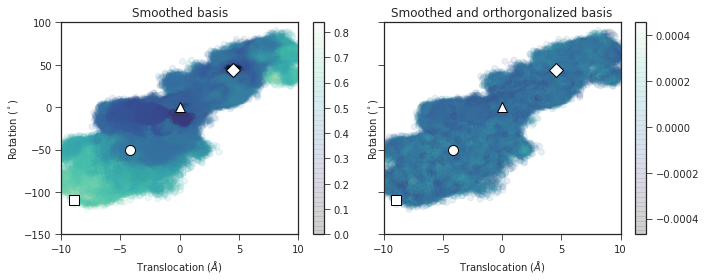

In [172]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    lifted_cvs[::10, 0],
    lifted_cvs[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    lifted_cvs[::10, 0],
    lifted_cvs[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [173]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

In [174]:
basisF = np.split(basis_white, lifted_traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), lifted_traj_inds)
guessU = np.split(np.squeeze(guess_upp), lifted_traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

237 (9500, 66)
237
237


## COM 

In [175]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(embed_trajs, lag)
    weights.append(com)

Computing change of measure for lag 1
Computing change of measure for lag 2
Computing change of measure for lag 5
Computing change of measure for lag 10
Computing change of measure for lag 20
Computing change of measure for lag 50
Computing change of measure for lag 100
Computing change of measure for lag 200
Computing change of measure for lag 500
Computing change of measure for lag 1000
Computing change of measure for lag 2000
Computing change of measure for lag 3000
Computing change of measure for lag 4000
Computing change of measure for lag 5000


In [176]:
np.save("../../data/delay_embed/sb6_5ns_10embed/coms", weights)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [177]:
print(len(weights), len(weights[0]), weights[0][0].shape)

14 237 (9500,)


## Committors

In [178]:
in_domain = np.split(mask, lifted_traj_inds)
in_domain[0].shape

(9500,)

In [179]:
q_downup, q_updown, qb_downup, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000
Calculating committors for lag 3000
Calculating committors for lag 4000
Calculating committors for lag 5000


In [180]:
np.save("../../data/delay_embed/sb6_5ns_10embed/q_downup", q_downup)
np.save("../../data/delay_embed/sb6_5ns_10embed/qb_downup", qb_downup)
np.save("../../data/delay_embed/sb6_5ns_10embed/q_updown", q_updown)
np.save("../../data/delay_embed/sb6_5ns_10embed/qb_updown", qb_updown)

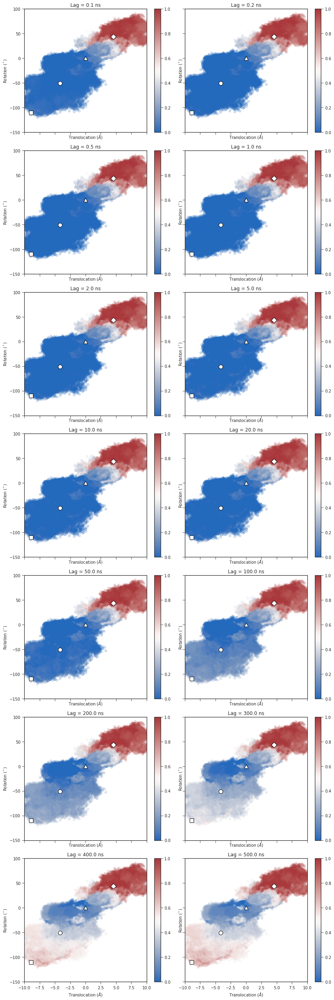

In [181]:
f, axs = plt.subplots(7, 2, figsize=(12, 35), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*lifted_cvs[::10].T, c=q_arr[::10], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)
f.tight_layout()

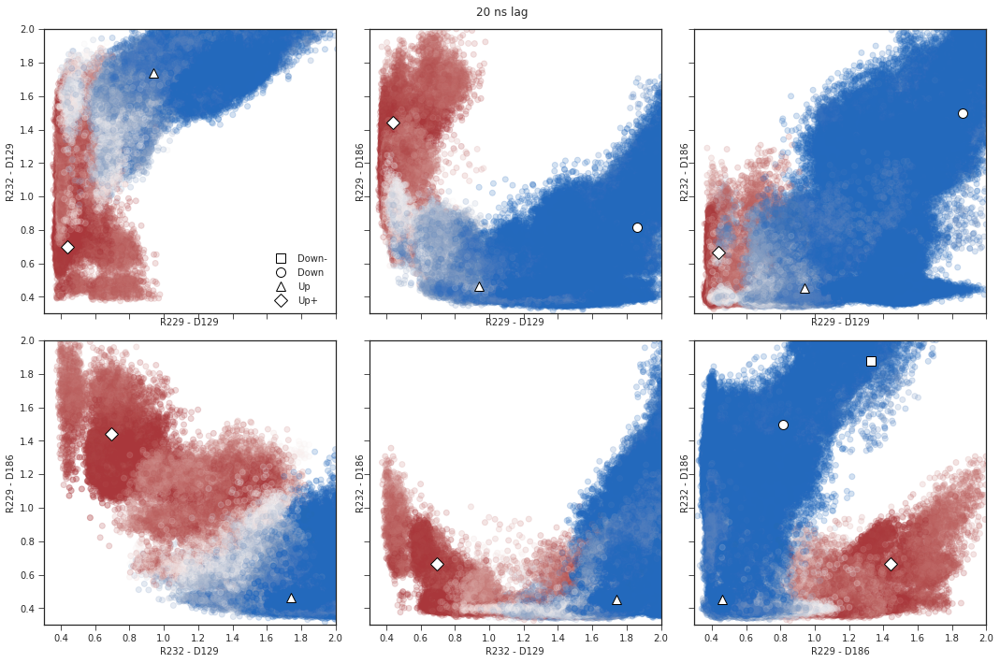

In [182]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_downup[7]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(
        lifted_sbs[::10, sb1],
        lifted_sbs[::10, sb2],
        c=q_arr[::10],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("20 ns lag")
f.tight_layout()

# More delays

In [183]:
n_embed = 20  # 5 ns
lag = 50
# use smaller input feature set
# R223-D129, R226-D129, R226-D186, R229-D129, R229-D186, R232-D186
sb_ids = [36, 42, 47, 48, 53, 59]
data_sb = [traj[:, sb_ids] for traj in data_trajs]
embed_trajs = delay_embed(data_sb, n_embed, lag)
embed_arr = np.concatenate(embed_trajs)

In [184]:
print(embed_arr.shape)

(2763000, 126)


In [185]:
print(len(embed_trajs))

237


In [186]:
print(embed_trajs[0].shape)

(9000, 126)


## States

In [187]:
# len(**_ids) is number of points in each state
# split into lists of trajectories
upplus = np.zeros(len(cv_arr), dtype=np.float)
upplus[upplus_ids] = True
upplus = np.split(upplus, orig_traj_inds)
up = np.zeros(len(cv_arr), dtype=np.float)
up[up_ids] = True
up = np.split(up, orig_traj_inds)

In [188]:
len(up)

237

In [189]:
up[0].shape

(10000,)

In [190]:
# delay embed indicator functions for states
lifted_up = lift_function(up, n_embed, lag=lag)
lifted_upplus = lift_function(upplus, n_embed, lag=lag)
print(len(lifted_up), lifted_up[0].shape)
print(len(lifted_upplus), lifted_upplus[0].shape)

237 (9000,)
237 (9000,)


In [191]:
len(up_ids)

9054

In [192]:
# lift CV data
lifted_cvs = lift_function(cv_trajs, n_embed, lag=lag)
lifted_sbs = lift_function(data_trajs, n_embed, lag=lag)
print(len(lifted_cvs), lifted_cvs[0].shape)
print(len(lifted_sbs), lifted_sbs[0].shape)

237 (9000, 2)
237 (9000, 60)


In [193]:
lifted_cvs = np.concatenate(lifted_cvs)
lifted_sbs = np.concatenate(lifted_sbs)
print(lifted_cvs.shape, lifted_sbs.shape)

(2763000, 2) (2763000, 60)


In [194]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

# new up and upplus ids
up_arr = np.concatenate(lifted_up)
up_ids_lifted = up_arr.nonzero()[0]
upplus_arr = np.concatenate(lifted_upplus)
upplus_ids_lifted = upplus_arr.nonzero()[0]

# states in data
up_data = embed_arr[up_ids_lifted]
upplus_data = embed_arr[upplus_ids_lifted]
print(len(up_data), len(upplus_data))

5960 22152


In [195]:
# assert (len(upplus_ids) + len(up_ids) + len(mask)) == len(cv_arr)
print(f"Number of up+ structures:  {len(upplus_ids_lifted)}")
print(f"Number of up structures:   {len(up_ids_lifted)}")
# print(f'Number of other structures: {len(other)}')

Number of up+ structures:  22152
Number of up structures:   5960


## Pairwise distances

In [196]:
print(sklearn.get_config()["working_memory"])

1024


In [197]:
# compute minimum distance (minimum of column) from domain to dimeric/monomeric state
def reduce_func(D_chunk, start):
    min2 = np.min(D_chunk, axis=1)
    return min2

### Up state 

In [198]:
d_up = []
counter = 0.0
tot = len(embed_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, up_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.82% completed
1.63% completed
2.45% completed
3.26% completed
4.08% completed
4.89% completed
5.71% completed
6.52% completed
7.34% completed
8.15% completed
8.97% completed
9.78% completed
10.60% completed
11.41% completed
12.23% completed
13.04% completed
13.86% completed
14.67% completed
15.49% completed
16.30% completed
17.12% completed
17.93% completed
18.75% completed
19.56% completed
20.38% completed
21.19% completed
22.01% completed
22.82% completed
23.64% completed
24.45% completed
25.27% completed
26.08% completed
26.90% completed
27.71% completed
28.53% completed
29.34% completed
30.16% completed
30.97% completed
31.79% completed
32.60% completed
33.42% completed
34.23% completed
35.05% completed
35.86% completed
36.68% completed
37.49% completed
38.31% completed
39.12% completed
39.94% completed
40.75% completed
41.57% completed
42.38% completed
43.20% completed
44.01% completed
44.83% completed
45.64% completed
46.46% completed
47.27% completed
48.09% completed
48.90% co

In [199]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids_lifted]))
d_up_arr[up_ids_lifted] = 0
print(np.max(d_up_arr[up_ids_lifted]))

print(d_up_arr.shape)

123 (22519,)
(2763000, 1)
2.9200194e-07
0.0
(2763000, 1)


In [200]:
np.save("../../data/delay_embed/sb6_5ns_20embed/dist_up.npy", d_up_arr)

In [19]:
d_up_arr = np.load("../../data/feat3_dist_anton/100/dist_up.npy")

### Up+state

In [201]:
d_upp = []
counter = 0.0
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, upplus_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.22% completed
0.44% completed
0.66% completed
0.88% completed
1.10% completed
1.32% completed
1.53% completed
1.75% completed
1.97% completed
2.19% completed
2.41% completed
2.63% completed
2.85% completed
3.07% completed
3.29% completed
3.51% completed
3.73% completed
3.95% completed
4.17% completed
4.39% completed
4.60% completed
4.82% completed
5.04% completed
5.26% completed
5.48% completed
5.70% completed
5.92% completed
6.14% completed
6.36% completed
6.58% completed
6.80% completed
7.02% completed
7.24% completed
7.45% completed
7.67% completed
7.89% completed
8.11% completed
8.33% completed
8.55% completed
8.77% completed
8.99% completed
9.21% completed
9.43% completed
9.65% completed
9.87% completed
10.09% completed
10.30% completed
10.52% completed
10.74% completed
10.96% completed
11.18% completed
11.40% completed
11.62% completed
11.84% completed
12.06% completed
12.28% completed
12.50% completed
12.72% completed
12.94% completed
13.16% completed
13.37% completed
13.59% c

In [202]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_up_arr[upplus_ids_lifted]))
d_upp_arr[upplus_ids_lifted] = 0
print(np.max(d_upp_arr[upplus_ids_lifted]))

print(d_upp_arr.shape)

457 (6058,)
(2763000, 1)
6.9522753
0.0
(2763000, 1)


In [203]:
np.save("../../data/delay_embed/sb6_5ns_20embed/dist_upplus.npy", d_upp_arr)

## Basis set construction 

In [204]:
# make smoothing function
smooth = (d_up_arr * d_upp_arr) ** 0.5 / (d_up_arr + d_upp_arr)

# make guess
guess_up = (d_upp_arr / (d_up_arr + d_upp_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
mask = np.ones(len(embed_arr), dtype=bool)
mask[up_ids_lifted] = False
mask[upplus_ids_lifted] = False
smooth[(mask == 0).flatten()] = 0

# ensure homogeneous boundary conditions for guess
guess_up[up_ids_lifted] = 1
guess_up[upplus_ids_lifted] = 0
guess_upp[upplus_ids_lifted] = 1
guess_upp[up_ids_lifted] = 0

In [205]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(2763000, 1) (2763000, 1) (2763000, 1)


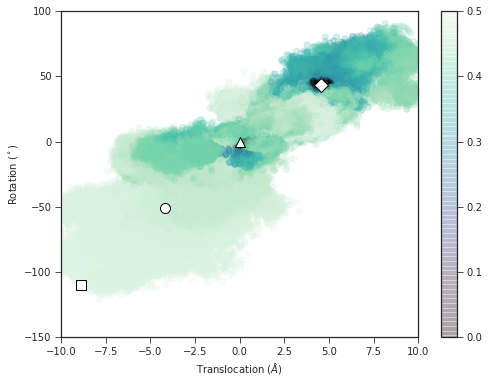

In [206]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=smooth[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

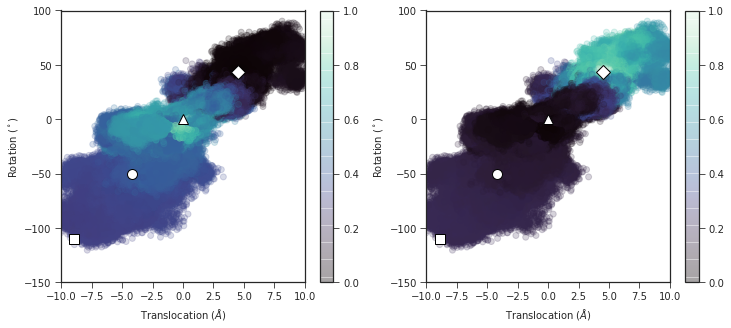

In [207]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [209]:
basis_smooth = smooth * embed_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(2763000, 126)
(2763000, 126)


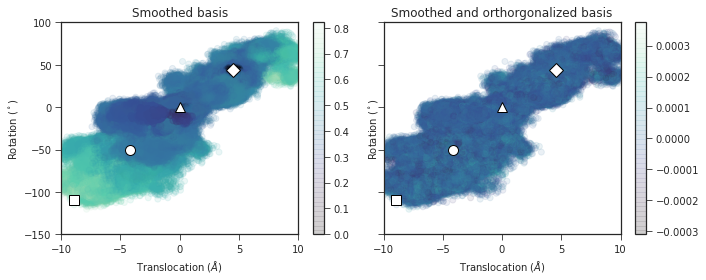

In [210]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    lifted_cvs[::10, 0],
    lifted_cvs[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    lifted_cvs[::10, 0],
    lifted_cvs[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [173]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

In [211]:
basisF = np.split(basis_white, lifted_traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), lifted_traj_inds)
guessU = np.split(np.squeeze(guess_upp), lifted_traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

237 (9000, 126)
237
237


## COM 

In [212]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(embed_trajs, lag)
    weights.append(com)

Computing change of measure for lag 1
Computing change of measure for lag 2
Computing change of measure for lag 5
Computing change of measure for lag 10
Computing change of measure for lag 20
Computing change of measure for lag 50
Computing change of measure for lag 100
Computing change of measure for lag 200
Computing change of measure for lag 500
Computing change of measure for lag 1000
Computing change of measure for lag 2000
Computing change of measure for lag 3000
Computing change of measure for lag 4000
Computing change of measure for lag 5000


In [213]:
np.save("../../data/delay_embed/sb6_5ns_20embed/coms", weights)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [214]:
print(len(weights), len(weights[0]), weights[0][0].shape)

14 237 (9000,)


## Committors

In [215]:
in_domain = np.split(mask, lifted_traj_inds)
in_domain[0].shape

(9000,)

In [216]:
q_downup, q_updown, qb_downup, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000
Calculating committors for lag 3000
Calculating committors for lag 4000
Calculating committors for lag 5000


In [217]:
np.save("../../data/delay_embed/sb6_5ns_20embed/q_downup", q_downup)
np.save("../../data/delay_embed/sb6_5ns_20embed/qb_downup", qb_downup)
np.save("../../data/delay_embed/sb6_5ns_20embed/q_updown", q_updown)
np.save("../../data/delay_embed/sb6_5ns_20embed/qb_updown", qb_updown)

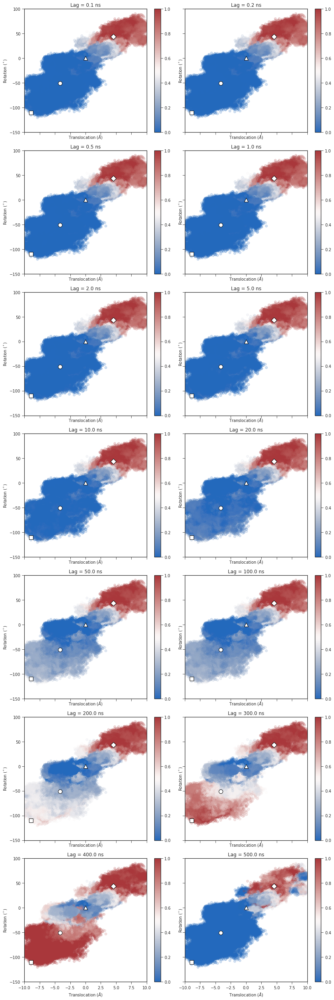

In [218]:
f, axs = plt.subplots(7, 2, figsize=(12, 35), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*lifted_cvs[::10].T, c=q_arr[::10], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)
f.tight_layout()

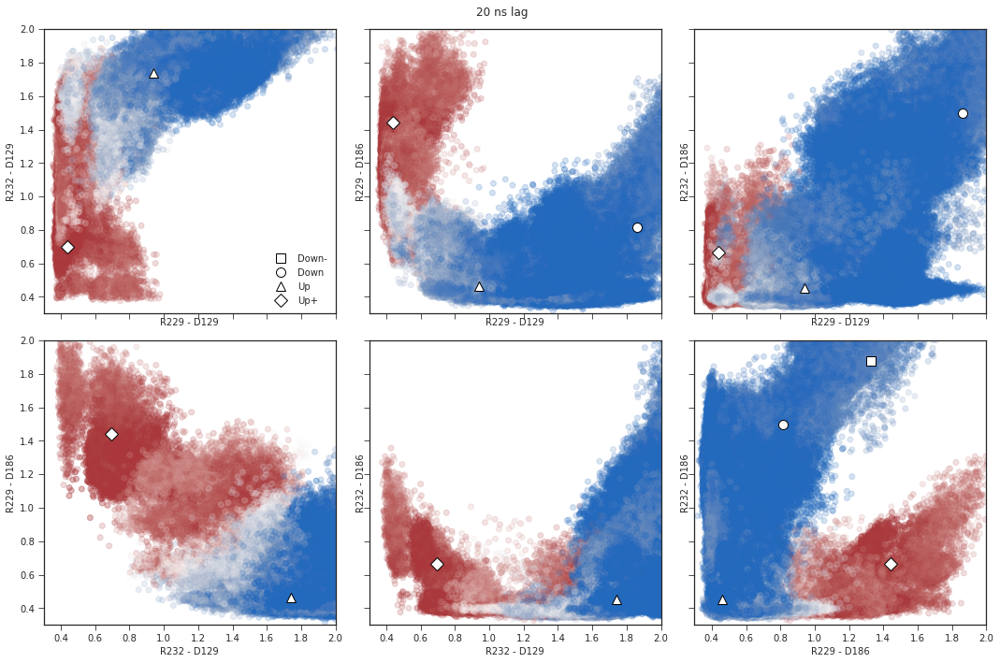

In [219]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_downup[7]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(
        lifted_sbs[::10, sb1],
        lifted_sbs[::10, sb2],
        c=q_arr[::10],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("20 ns lag")
f.tight_layout()

# Shorter lag, more embeddings 

6.28.21

In [30]:
n_embed = 20
lag = 10  # 5 ns
# use smaller input feature set
# R223-D129, R226-D129, R226-D186, R229-D129, R229-D186, R232-D186
sb_ids = [36, 42, 47, 48, 53, 59]
data_sb = [traj[:, sb_ids] for traj in data_trajs]
embed_trajs = delay_embed(data_sb, n_embed, lag)
embed_arr = np.concatenate(embed_trajs)

In [31]:
print(embed_arr.shape)

(2952600, 126)


In [32]:
print(len(embed_trajs))

237


In [33]:
print(embed_trajs[0].shape)

(9800, 126)


## States

In [34]:
# len(**_ids) is number of points in each state
# split into lists of trajectories
upplus = np.zeros(len(cv_arr), dtype=np.float)
upplus[upplus_ids] = True
upplus = np.split(upplus, orig_traj_inds)
up = np.zeros(len(cv_arr), dtype=np.float)
up[up_ids] = True
up = np.split(up, orig_traj_inds)

In [35]:
len(up)

237

In [36]:
up[0].shape

(10000,)

In [37]:
# delay embed indicator functions for states
lifted_up = lift_function(up, n_embed, lag=lag)
lifted_upplus = lift_function(upplus, n_embed, lag=lag)
print(len(lifted_up), lifted_up[0].shape)
print(len(lifted_upplus), lifted_upplus[0].shape)

237 (9800,)
237 (9800,)


In [38]:
len(up_ids)

9054

In [39]:
# lift CV data
lifted_cvs = lift_function(cv_trajs, n_embed, lag=lag)
lifted_sbs = lift_function(data_trajs, n_embed, lag=lag)
print(len(lifted_cvs), lifted_cvs[0].shape)
print(len(lifted_sbs), lifted_sbs[0].shape)

237 (9800, 2)
237 (9800, 60)


In [40]:
lifted_cvs = np.concatenate(lifted_cvs)
lifted_sbs = np.concatenate(lifted_sbs)
print(lifted_cvs.shape, lifted_sbs.shape)

(2952600, 2) (2952600, 60)


In [41]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

# new up and upplus ids
up_arr = np.concatenate(lifted_up)
up_ids_lifted = up_arr.nonzero()[0]
upplus_arr = np.concatenate(lifted_upplus)
upplus_ids_lifted = upplus_arr.nonzero()[0]

# states in data
up_data = embed_arr[up_ids_lifted]
upplus_data = embed_arr[upplus_ids_lifted]
print(len(up_data), len(upplus_data))

8217 24160


In [42]:
# assert (len(upplus_ids) + len(up_ids) + len(mask)) == len(cv_arr)
print(f"Number of up+ structures:  {len(upplus_ids_lifted)}")
print(f"Number of up structures:   {len(up_ids_lifted)}")
# print(f'Number of other structures: {len(other)}')

Number of up+ structures:  24160
Number of up structures:   8217


## Pairwise distances

In [43]:
print(sklearn.get_config()["working_memory"])

1024


In [44]:
# compute minimum distance (minimum of column) from domain to dimeric/monomeric state
def reduce_func(D_chunk, start):
    min2 = np.min(D_chunk, axis=1)
    return min2

### Up state 

In [45]:
d_up = []
counter = 0.0
tot = len(embed_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, up_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.55% completed
1.11% completed
1.66% completed
2.21% completed
2.77% completed
3.32% completed
3.87% completed
4.43% completed
4.98% completed
5.53% completed
6.09% completed
6.64% completed
7.19% completed
7.74% completed
8.30% completed
8.85% completed
9.40% completed
9.96% completed
10.51% completed
11.06% completed
11.62% completed
12.17% completed
12.72% completed
13.28% completed
13.83% completed
14.38% completed
14.94% completed
15.49% completed
16.04% completed
16.60% completed
17.15% completed
17.70% completed
18.26% completed
18.81% completed
19.36% completed
19.92% completed
20.47% completed
21.02% completed
21.58% completed
22.13% completed
22.68% completed
23.23% completed
23.79% completed
24.34% completed
24.89% completed
25.45% completed
26.00% completed
26.55% completed
27.11% completed
27.66% completed
28.21% completed
28.77% completed
29.32% completed
29.87% completed
30.43% completed
30.98% completed
31.53% completed
32.09% completed
32.64% completed
33.19% complete

In [46]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids_lifted]))
d_up_arr[up_ids_lifted] = 0
print(np.max(d_up_arr[up_ids_lifted]))

print(d_up_arr.shape)

181 (16334,)
(2952600, 1)
2.9200194e-07
0.0
(2952600, 1)


In [47]:
np.save("../../data/delay_embed/sb6_1ns_20embed/dist_up.npy", d_up_arr)

In [19]:
d_up_arr = np.load("../../data/feat3_dist_anton/100/dist_up.npy")

### Up+state

In [48]:
d_upp = []
counter = 0.0
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, upplus_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.19% completed
0.38% completed
0.56% completed
0.75% completed
0.94% completed
1.13% completed
1.32% completed
1.51% completed
1.69% completed
1.88% completed
2.07% completed
2.26% completed
2.45% completed
2.63% completed
2.82% completed
3.01% completed
3.20% completed
3.39% completed
3.57% completed
3.76% completed
3.95% completed
4.14% completed
4.33% completed
4.52% completed
4.70% completed
4.89% completed
5.08% completed
5.27% completed
5.46% completed
5.64% completed
5.83% completed
6.02% completed
6.21% completed
6.40% completed
6.58% completed
6.77% completed
6.96% completed
7.15% completed
7.34% completed
7.53% completed
7.71% completed
7.90% completed
8.09% completed
8.28% completed
8.47% completed
8.65% completed
8.84% completed
9.03% completed
9.22% completed
9.41% completed
9.60% completed
9.78% completed
9.97% completed
10.16% completed
10.35% completed
10.54% completed
10.72% completed
10.91% completed
11.10% completed
11.29% completed
11.48% completed
11.66% completed

91.62% completed
91.81% completed
92.00% completed
92.19% completed
92.38% completed
92.56% completed
92.75% completed
92.94% completed
93.13% completed
93.32% completed
93.51% completed
93.69% completed
93.88% completed
94.07% completed
94.26% completed
94.45% completed
94.63% completed
94.82% completed
95.01% completed
95.20% completed
95.39% completed
95.57% completed
95.76% completed
95.95% completed
96.14% completed
96.33% completed
96.52% completed
96.70% completed
96.89% completed
97.08% completed
97.27% completed
97.46% completed
97.64% completed
97.83% completed
98.02% completed
98.21% completed
98.40% completed
98.58% completed
98.77% completed
98.96% completed
99.15% completed
99.34% completed
99.53% completed
99.71% completed
99.90% completed
100.00% completed


In [49]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_up_arr[upplus_ids_lifted]))
d_upp_arr[upplus_ids_lifted] = 0
print(np.max(d_upp_arr[upplus_ids_lifted]))

print(d_upp_arr.shape)

532 (5555,)
(2952600, 1)
7.4285936
0.0
(2952600, 1)


In [50]:
np.save("../../data/delay_embed/sb6_1ns_20embed/dist_upplus.npy", d_upp_arr)

## Basis set construction 

In [51]:
# make smoothing function
smooth = (d_up_arr * d_upp_arr) ** 0.5 / (d_up_arr + d_upp_arr)

# make guess
guess_up = (d_upp_arr / (d_up_arr + d_upp_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
mask = np.ones(len(embed_arr), dtype=bool)
mask[up_ids_lifted] = False
mask[upplus_ids_lifted] = False
smooth[(mask == 0).flatten()] = 0

# ensure homogeneous boundary conditions for guess
guess_up[up_ids_lifted] = 1
guess_up[upplus_ids_lifted] = 0
guess_upp[upplus_ids_lifted] = 1
guess_upp[up_ids_lifted] = 0

In [52]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(2952600, 1) (2952600, 1) (2952600, 1)


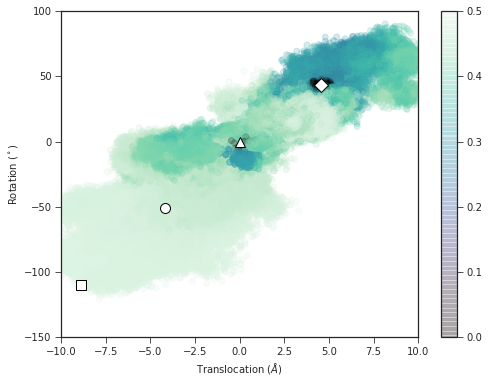

In [53]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=smooth[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

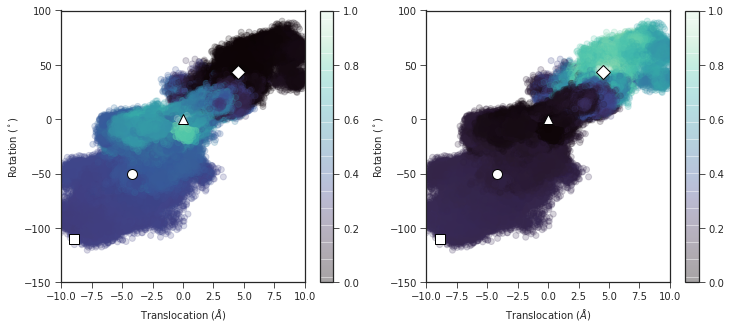

In [54]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [56]:
def svd_whiten(X, num_retain=None):
    U, L, V = np.linalg.svd(X, full_matrices=False)
    if num_retain is None:
        return U
    else:
        return U[:, :num_retain]

In [57]:
basis_smooth = smooth * embed_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(2952600, 126)
(2952600, 126)


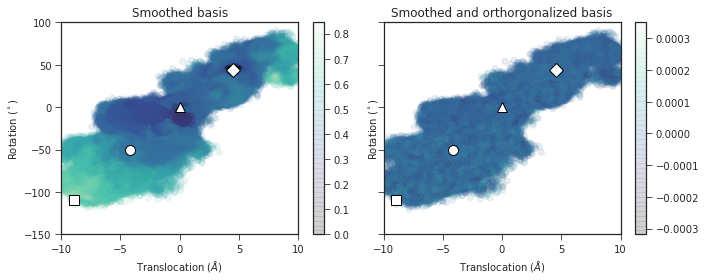

In [58]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    lifted_cvs[::10, 0],
    lifted_cvs[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    lifted_cvs[::10, 0],
    lifted_cvs[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [59]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

In [60]:
basisF = np.split(basis_white, lifted_traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), lifted_traj_inds)
guessU = np.split(np.squeeze(guess_upp), lifted_traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

237 (9800, 126)
237
237


## weights 

In [61]:
# unit is 0.1 ps, up to 500 ns
lags = [1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 3000, 4000, 5000]

In [62]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(embed_trajs, lag)
    weights.append(com)

Computing change of measure for lag 1
Computing change of measure for lag 2
Computing change of measure for lag 5
Computing change of measure for lag 10
Computing change of measure for lag 20
Computing change of measure for lag 50
Computing change of measure for lag 100
Computing change of measure for lag 200
Computing change of measure for lag 500
Computing change of measure for lag 1000
Computing change of measure for lag 2000
Computing change of measure for lag 3000
Computing change of measure for lag 4000
Computing change of measure for lag 5000


In [63]:
np.save("../../data/delay_embed/sb6_1ns_20embed/coms", weights)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [64]:
print(len(weights), len(weights[0]), weights[0][0].shape)

14 237 (9800,)


## Committors

In [65]:
in_domain = np.split(mask, lifted_traj_inds)
in_domain[0].shape

(9800,)

In [66]:
in_domain = np.split(mask, lifted_traj_inds)
q_downup, q_updown, qb_downup, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000
Calculating committors for lag 3000
Calculating committors for lag 4000
Calculating committors for lag 5000


In [67]:
np.save("../../data/delay_embed/sb6_1ns_20embed/q_downup", q_downup)
np.save("../../data/delay_embed/sb6_1ns_20embed/qb_downup", qb_downup)
np.save("../../data/delay_embed/sb6_1ns_20embed/q_updown", q_updown)
np.save("../../data/delay_embed/sb6_1ns_20embed/qb_updown", qb_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


### forward committor activation 

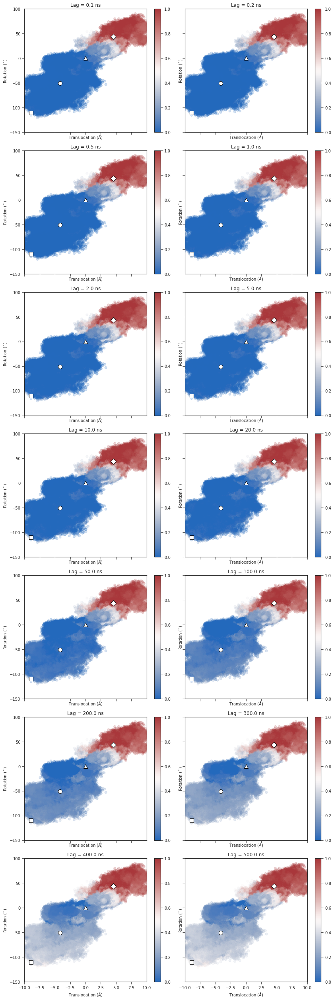

In [68]:
f, axs = plt.subplots(7, 2, figsize=(12, 35), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*lifted_cvs[::10].T, c=q_arr[::10], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)
f.tight_layout()

In [69]:
# useful salt bridges for up to up+ transition
# R229-D129, R232-D129, R229-D186, R232-D186
sb_ids_uu = [48, 54, 53, 59]

In [70]:
from itertools import combinations

In [71]:
feat2_models = np.load("../../data/models_centroids_feat2.npy")

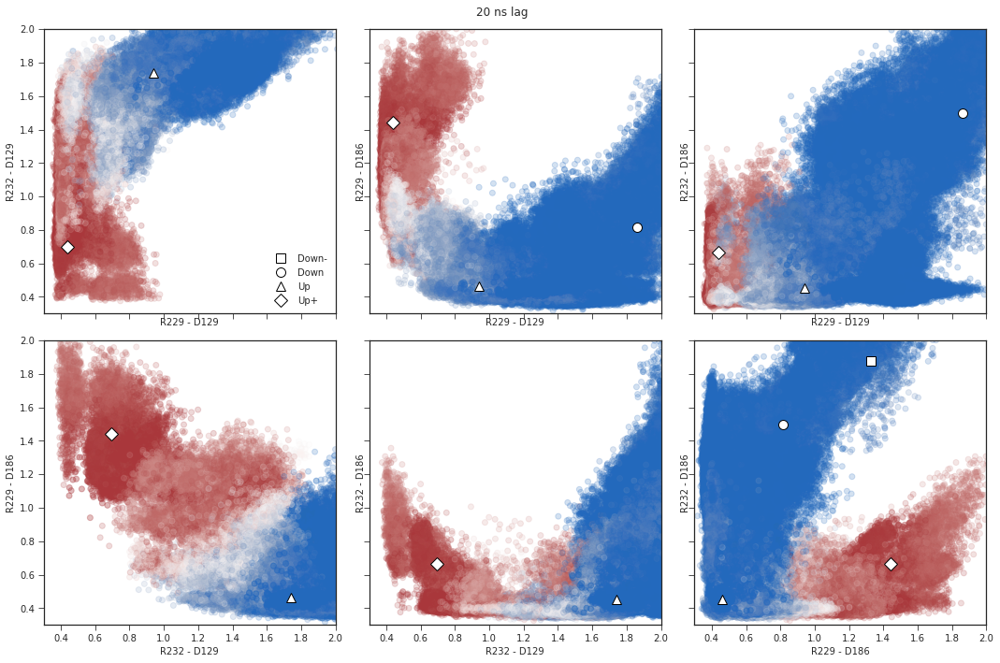

In [72]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_downup[7]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(
        lifted_sbs[::10, sb1],
        lifted_sbs[::10, sb2],
        c=q_arr[::10],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("20 ns lag")
f.tight_layout()

# 40 delays

In [73]:
n_embed = 40
lag = 10  # 1 ns
# use smaller input feature set
# R223-D129, R226-D129, R226-D186, R229-D129, R229-D186, R232-D186
sb_ids = [36, 42, 47, 48, 53, 59]
data_sb = [traj[:, sb_ids] for traj in data_trajs]
embed_trajs = delay_embed(data_sb, n_embed, lag)
embed_arr = np.concatenate(embed_trajs)

In [74]:
print(embed_arr.shape)

(2905200, 246)


In [75]:
print(len(embed_trajs))

237


In [76]:
print(embed_trajs[0].shape)

(9600, 246)


## States

In [77]:
# len(**_ids) is number of points in each state
# split into lists of trajectories
upplus = np.zeros(len(cv_arr), dtype=np.float)
upplus[upplus_ids] = True
upplus = np.split(upplus, orig_traj_inds)
up = np.zeros(len(cv_arr), dtype=np.float)
up[up_ids] = True
up = np.split(up, orig_traj_inds)

In [78]:
len(up)

237

In [79]:
up[0].shape

(10000,)

In [80]:
# delay embed indicator functions for states
lifted_up = lift_function(up, n_embed, lag=lag)
lifted_upplus = lift_function(upplus, n_embed, lag=lag)
print(len(lifted_up), lifted_up[0].shape)
print(len(lifted_upplus), lifted_upplus[0].shape)

237 (9600,)
237 (9600,)


In [81]:
len(up_ids)

9054

In [82]:
# lift CV data
lifted_cvs = lift_function(cv_trajs, n_embed, lag=lag)
lifted_sbs = lift_function(data_trajs, n_embed, lag=lag)
print(len(lifted_cvs), lifted_cvs[0].shape)
print(len(lifted_sbs), lifted_sbs[0].shape)

237 (9600, 2)
237 (9600, 60)


In [83]:
lifted_cvs = np.concatenate(lifted_cvs)
lifted_sbs = np.concatenate(lifted_sbs)
print(lifted_cvs.shape, lifted_sbs.shape)

(2905200, 2) (2905200, 60)


In [84]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

# new up and upplus ids
up_arr = np.concatenate(lifted_up)
up_ids_lifted = up_arr.nonzero()[0]
upplus_arr = np.concatenate(lifted_upplus)
upplus_ids_lifted = upplus_arr.nonzero()[0]

# states in data
up_data = embed_arr[up_ids_lifted]
upplus_data = embed_arr[upplus_ids_lifted]
print(len(up_data), len(upplus_data))

7588 23690


In [85]:
# assert (len(upplus_ids) + len(up_ids) + len(mask)) == len(cv_arr)
print(f"Number of up+ structures:  {len(upplus_ids_lifted)}")
print(f"Number of up structures:   {len(up_ids_lifted)}")
# print(f'Number of other structures: {len(other)}')

Number of up+ structures:  23690
Number of up structures:   7588


## Pairwise distances

### Up state 

In [87]:
d_up = []
counter = 0.0
tot = len(embed_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, up_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.61% completed
1.22% completed
1.83% completed
2.44% completed
3.04% completed
3.65% completed
4.26% completed
4.87% completed
5.48% completed
6.09% completed
6.70% completed
7.31% completed
7.91% completed
8.52% completed
9.13% completed
9.74% completed
10.35% completed
10.96% completed
11.57% completed
12.18% completed
12.79% completed
13.39% completed
14.00% completed
14.61% completed
15.22% completed
15.83% completed
16.44% completed
17.05% completed
17.66% completed
18.27% completed
18.87% completed
19.48% completed
20.09% completed
20.70% completed
21.31% completed
21.92% completed
22.53% completed
23.14% completed
23.74% completed
24.35% completed
24.96% completed
25.57% completed
26.18% completed
26.79% completed
27.40% completed
28.01% completed
28.62% completed
29.22% completed
29.83% completed
30.44% completed
31.05% completed
31.66% completed
32.27% completed
32.88% completed
33.49% completed
34.10% completed
34.70% completed
35.31% completed
35.92% completed
36.53% comple

In [88]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids_lifted]))
d_up_arr[up_ids_lifted] = 0
print(np.max(d_up_arr[up_ids_lifted]))

print(d_up_arr.shape)

165 (17688,)
(2905200, 1)
6.078505e-07
0.0
(2905200, 1)


In [89]:
np.save("../../data/delay_embed/sb6_1ns_40embed/dist_up.npy", d_up_arr)

In [19]:
d_up_arr = np.load("../../data/feat3_dist_anton/100/dist_up.npy")

### Up+state

In [90]:
d_upp = []
counter = 0.0
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, upplus_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.19% completed
0.39% completed
0.58% completed
0.78% completed
0.97% completed
1.17% completed
1.36% completed
1.56% completed
1.75% completed
1.95% completed
2.14% completed
2.34% completed
2.53% completed
2.73% completed
2.92% completed
3.12% completed
3.31% completed
3.51% completed
3.70% completed
3.90% completed
4.09% completed
4.29% completed
4.48% completed
4.68% completed
4.87% completed
5.07% completed
5.26% completed
5.46% completed
5.65% completed
5.85% completed
6.04% completed
6.24% completed
6.43% completed
6.63% completed
6.82% completed
7.02% completed
7.21% completed
7.41% completed
7.60% completed
7.80% completed
7.99% completed
8.19% completed
8.38% completed
8.58% completed
8.77% completed
8.97% completed
9.16% completed
9.36% completed
9.55% completed
9.75% completed
9.94% completed
10.14% completed
10.33% completed
10.53% completed
10.72% completed
10.92% completed
11.11% completed
11.31% completed
11.50% completed
11.70% completed
11.89% completed
12.09% complet

94.77% completed
94.96% completed
95.16% completed
95.35% completed
95.55% completed
95.74% completed
95.94% completed
96.13% completed
96.33% completed
96.52% completed
96.72% completed
96.91% completed
97.11% completed
97.30% completed
97.50% completed
97.69% completed
97.89% completed
98.08% completed
98.28% completed
98.47% completed
98.67% completed
98.86% completed
99.06% completed
99.25% completed
99.45% completed
99.64% completed
99.84% completed
100.00% completed


In [91]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_up_arr[upplus_ids_lifted]))
d_upp_arr[upplus_ids_lifted] = 0
print(np.max(d_upp_arr[upplus_ids_lifted]))

print(d_upp_arr.shape)

513 (5665,)
(2905200, 1)
10.510385
0.0
(2905200, 1)


In [92]:
np.save("../../data/delay_embed/sb6_1ns_40embed/dist_upplus.npy", d_upp_arr)

## Basis set construction 

In [93]:
# make smoothing function
smooth = (d_up_arr * d_upp_arr) ** 0.5 / (d_up_arr + d_upp_arr)

# make guess
guess_up = (d_upp_arr / (d_up_arr + d_upp_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
mask = np.ones(len(embed_arr), dtype=bool)
mask[up_ids_lifted] = False
mask[upplus_ids_lifted] = False
smooth[(mask == 0).flatten()] = 0

# ensure homogeneous boundary conditions for guess
guess_up[up_ids_lifted] = 1
guess_up[upplus_ids_lifted] = 0
guess_upp[upplus_ids_lifted] = 1
guess_upp[up_ids_lifted] = 0

In [94]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(2905200, 1) (2905200, 1) (2905200, 1)


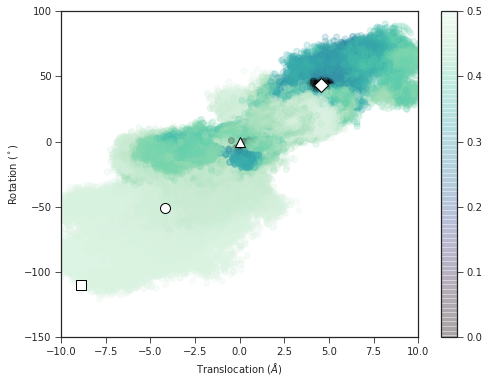

In [95]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=smooth[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

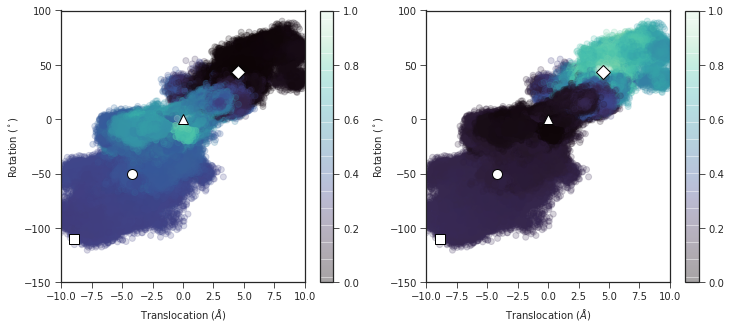

In [96]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    lifted_cvs[::10, 0], lifted_cvs[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [97]:
basis_smooth = smooth * embed_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(2905200, 246)
(2905200, 246)


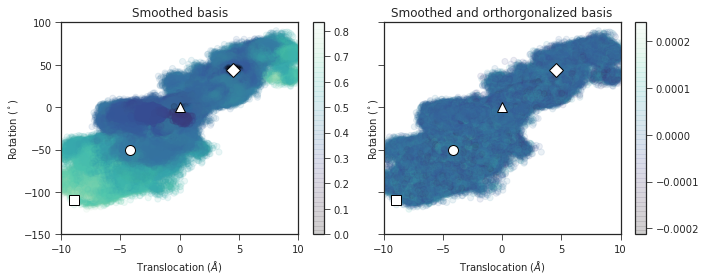

In [98]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    lifted_cvs[::10, 0],
    lifted_cvs[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    lifted_cvs[::10, 0],
    lifted_cvs[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [99]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

In [100]:
basisF = np.split(basis_white, lifted_traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), lifted_traj_inds)
guessU = np.split(np.squeeze(guess_upp), lifted_traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

237 (9600, 246)
237
237


## weights 

In [ ]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(embed_trajs, lag)
    weights.append(com)

Computing change of measure for lag 1
Computing change of measure for lag 2
Computing change of measure for lag 5
Computing change of measure for lag 10
Computing change of measure for lag 20
Computing change of measure for lag 50
Computing change of measure for lag 100
Computing change of measure for lag 200
Computing change of measure for lag 500
Computing change of measure for lag 1000
Computing change of measure for lag 2000


In [ ]:
np.save("../../data/delay_embed/sb6_1ns_40embed/coms", weights)

In [108]:
print(len(weights), len(weights[0]), weights[0][0].shape)

14 237 (9600,)


## Committors

In [109]:
in_domain = np.split(mask, lifted_traj_inds)
in_domain[0].shape

(9600,)

In [ ]:
in_domain = np.split(mask, lifted_traj_inds)
q_downup, q_updown, qb_downup, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

In [ ]:
np.save("../../data/delay_embed/sb6_1ns_40embed/q_downup", q_downup)
np.save("../../data/delay_embed/sb6_1ns_40embed/qb_downup", qb_downup)
np.save("../../data/delay_embed/sb6_1ns_40embed/q_updown", q_updown)
np.save("../../data/delay_embed/sb6_1ns_40embed/qb_updown", qb_updown)

### forward committor activation 

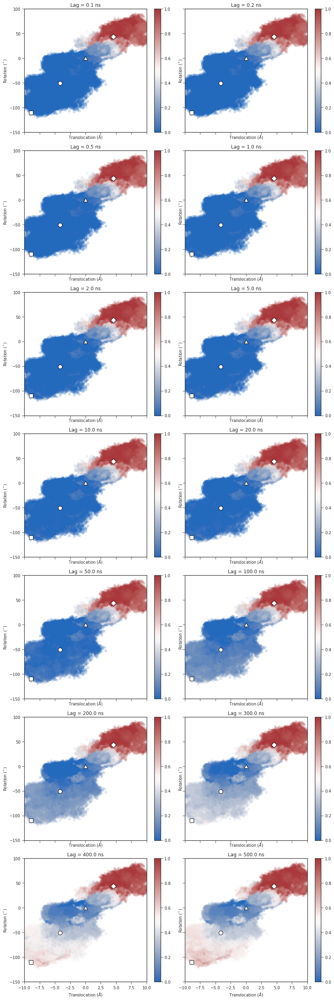

In [110]:
f, axs = plt.subplots(7, 2, figsize=(12, 35), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*lifted_cvs[::10].T, c=q_arr[::10], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)
f.tight_layout()

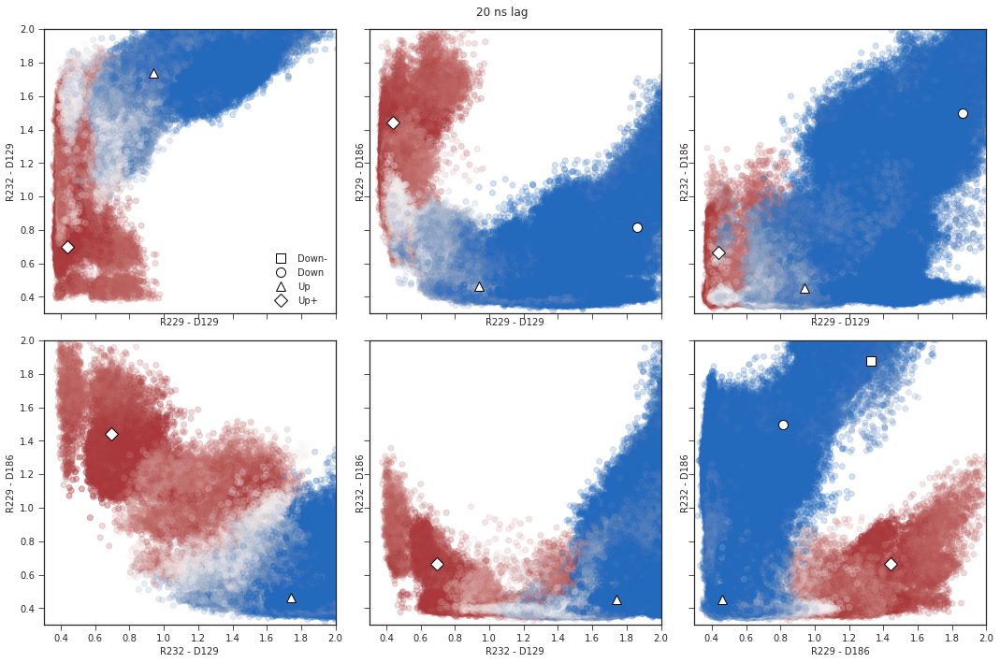

In [111]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_downup[7]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(
        lifted_sbs[::10, sb1],
        lifted_sbs[::10, sb2],
        c=q_arr[::10],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("20 ns lag")
f.tight_layout()